# Welcome To My First Data Analysis Project With Python
## به اولین پروژه دیتا آنالیز با پایتون من خوش آمدید 
### این پروژه بر روی چهارده عاملی کار می کند که باز یا بسته بودن چشم بر آنها مؤثر است 
### که در این پروژه علاوه بر ارتباط آن چهارده عامل با باز و بسته بودن چشم ، به ارتباط آنها با یکدیگر نیز می پردازیم 

# Step One : Importing The Required Libraries
### مرحله اول : وارد کردن کتابخانه های مورد نیاز

# Import Libraries 


In [4]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml
import seaborn as sns
from scipy.stats import stats

  # Step Two : Data Extraction
###   مرحله دوم :استخراج کردن داده ها

### Data Extraction

In [2]:
#خواندن فایل اصلی
a = fetch_openml('eeg-eye-state', as_frame=True)
#تبدیل آن به دیتا فریم 
d = pd.DataFrame(a.data)
#ریختن اطلاعات ستون ها در متغیری به نام x 
x = a.data
#ریختن اطلاعات وضعیت چشم در متغیری به نام y 
y = a.target.astype(np.uint8)
#مشاهده اطلاعات ستون ها 
print(x)
# مشاهده وضعیت چشم
# اگر 1 باشد : چشم بسته است
# اگر 2 باشد : چشم باز است
print(y)
# مشاهده ستون های عددی
print(d.describe())
# مشاهده اطلاعات دیتا فریم
print(d.info())
# تبدیل x و y به DataFrame واحد با نام z
z = pd.concat([x, y], axis=1)
# تعیین نام ستون‌ها
z.columns = [f"V{i + 1}" for i in range(14)] + ["Eye_State"]
# تعداد داده‌های باز و بسته چشم
z["Eye_State"].value_counts()

            V1       V2       V3       V4       V5       V6       V7       V8  \
0      4329.23  4009.23  4289.23  4148.21  4350.26  4586.15  4096.92  4641.03   
1      4324.62  4004.62  4293.85  4148.72  4342.05  4586.67  4097.44  4638.97   
2      4327.69  4006.67  4295.38  4156.41  4336.92  4583.59  4096.92  4630.26   
3      4328.72  4011.79  4296.41  4155.90  4343.59  4582.56  4097.44  4630.77   
4      4326.15  4011.79  4292.31  4151.28  4347.69  4586.67  4095.90  4627.69   
...        ...      ...      ...      ...      ...      ...      ...      ...   
14975  4281.03  3990.26  4245.64  4116.92  4333.85  4614.36  4074.87  4625.64   
14976  4276.92  3991.79  4245.13  4110.77  4332.82  4615.38  4073.33  4621.54   
14977  4277.44  3990.77  4246.67  4113.85  4333.33  4615.38  4072.82  4623.59   
14978  4284.62  3991.79  4251.28  4122.05  4334.36  4616.41  4080.51  4628.72   
14979  4287.69  3997.44  4260.00  4121.03  4333.33  4616.41  4088.72  4638.46   

            V9      V10    

Eye_State
1    8257
2    6723
Name: count, dtype: int64

####  تغییر دادن نوع داده 
#### Changing The Data Type 

In [3]:
# تغییر نوع ستون های دیتا فریم z 
for col in ["V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8", "V9", "V10", "V11", "V12", "V13", "V14"]:
    z[col] = z[col].astype(np.float32)
# مشاهده نوع متغیر y
print(y.dtype)
# مشاهده مجدد اطلاعات دیتا فریم
z.info()

uint8
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14980 entries, 0 to 14979
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   V1         14980 non-null  float32
 1   V2         14980 non-null  float32
 2   V3         14980 non-null  float32
 3   V4         14980 non-null  float32
 4   V5         14980 non-null  float32
 5   V6         14980 non-null  float32
 6   V7         14980 non-null  float32
 7   V8         14980 non-null  float32
 8   V9         14980 non-null  float32
 9   V10        14980 non-null  float32
 10  V11        14980 non-null  float32
 11  V12        14980 non-null  float32
 12  V13        14980 non-null  float32
 13  V14        14980 non-null  float32
 14  Eye_State  14980 non-null  uint8  
dtypes: float32(14), uint8(1)
memory usage: 834.0 KB


# Step Three : Data Cleaning
## مرحله سوم : تمیز کردن داده ها 


## Data Cleaning

In [4]:
# محاسبه Z-Score برای تمام ستون‌ها
# قرار دادن قدر مطلق برای شناسایی مقادیر منفی
z_scores = np.abs(stats.zscore(z))
#قرار دادن عدد 1.5 برای پیدا کردن داده های پرت و مشکوک به پرت  
outlier_mask = (z_scores > 1.5)
# نگه داشتن سطر ‌هایی که دارای داده پرت نیستند
cleaned_df_z = z[(~outlier_mask).all(axis=1)]
# مشاهده ردیف های پاکسازی شده
print("تعداد سطر ‌ها بعد از پاکسازی:", len(cleaned_df_z))
# ذخیره کردن داده‌های پاکسازی شده در یک فایل CSV جدید
cleaned_df_z.to_csv("cleaned-z.csv")
# قرار دادن ردیف های دارای داده پرت در متغیری به نام outliers
outliers = z[outlier_mask.any(axis=1)]
# مشاهده داده های پرت
print("داده‌های پرت:", outliers)
# ذخیره کردن داده‌های پرت در یک فایل CSV جدید
outliers.to_csv("outliers-report.csv")

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_12440\3456757287.py:3: DeprecationWarning: Please import `zscore` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  z_scores = np.abs(stats.zscore(z))


تعداد سطر ‌ها بعد از پاکسازی: 13726
داده‌های پرت:                 V1           V2           V3           V4           V5  \
153    4401.540039  4090.260010  4267.180176  4156.410156  4336.919922   
154    4412.310059  4094.360107  4262.560059  4149.229980  4332.310059   
155    4416.919922  4106.669922  4261.029785  4153.330078  4334.870117   
156    4430.259766  4123.080078  4268.209961  4156.919922  4336.919922   
157    4447.180176  4124.620117  4277.439941  4154.359863  4331.279785   
...            ...          ...          ...          ...          ...   
14934  4405.640137  4098.970215  4295.899902  4157.439941  4330.770020   
14935  4397.950195  4096.410156  4296.919922  4155.899902  4331.790039   
14936  4389.740234  4092.820068  4287.689941  4157.950195  4335.379883   
14937  4385.129883  4089.229980  4279.490234  4155.899902  4334.359863   
14938  4374.359863  4083.080078  4280.000000  4155.379883  4331.279785   

                V6           V7           V8           V9    

# Step Four : Reading The Cleaned Data And Plotting The Graphs
### مرحله چهارم : خواندن داده ی پاکسازی شده و رسم نمودار ها 

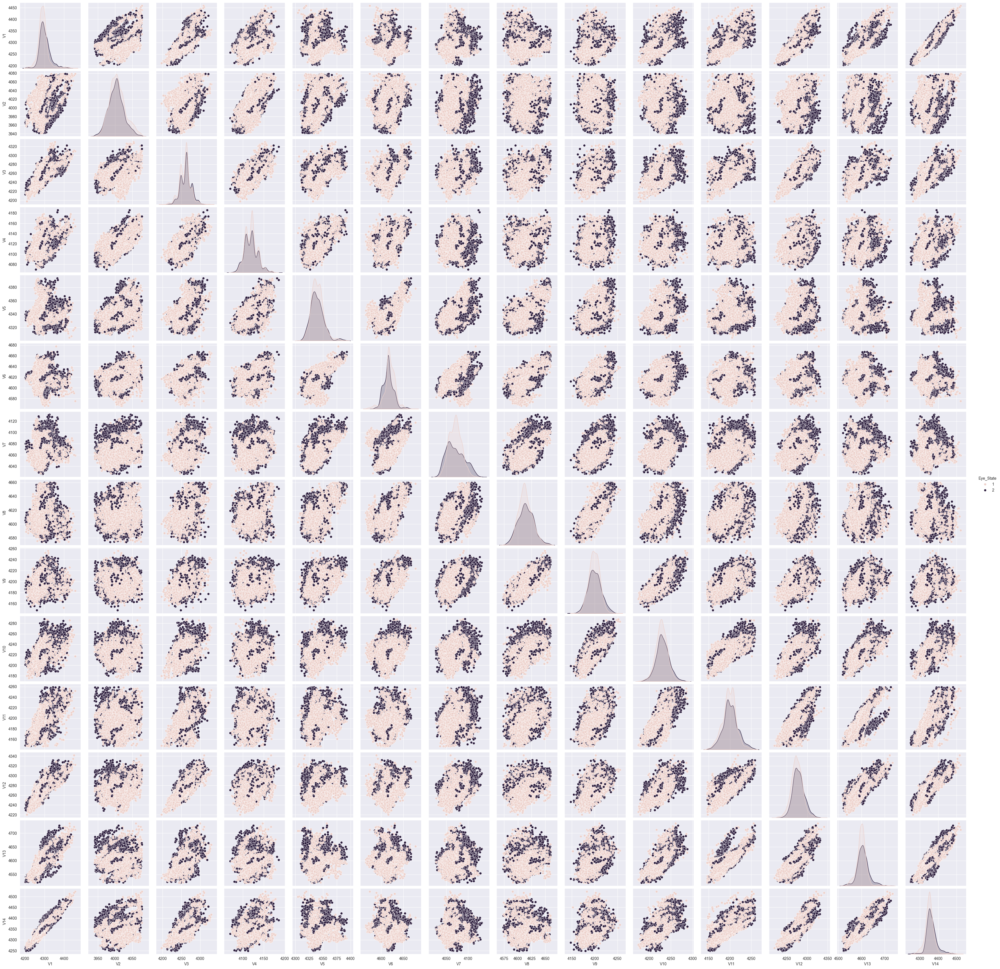

In [7]:
#خواندن دیتای تمیز شده
df = pd.read_csv("cleaned-z.csv")
#حذف ستونی با نام Unnamed 
#توضیح اینکه این ستون به خودی خود ایجاد شده بود 
df.drop(columns=["Unnamed: 0"], inplace=True)
# رسم نمودار بر حسب باز یا بسته بودن چشم
# اگر 1 باشد : چشم بسته است
# اگر 2 باشد : چشم باز است
sns.pairplot(df, hue="Eye_State")

<Axes: >

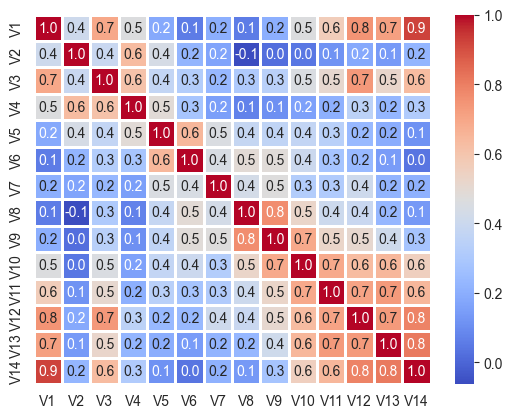

In [11]:
#  رسم نمودار heatmap با احتساب ظریب همبستگی بر حسب ستون های دیتا فریم به غیر از ستون Eye-State
c = ["V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8", "V9", "V10", "V11", "V12", "V13", "V14"]
sns.heatmap(df[c].corr(), cmap="coolwarm", annot=True, fmt=".1f", linewidths="1")

# Step Five : Data Analysis
### مرحله پنجم : تحلیل داده 

# تحلیل نمودار heatmap #
### V1-V14

## راهنما :
### 1- ارتباط رنگ ها 
#### رنگ قرمز : ارتباط مستقیم
### رنگ آبی : ارتباط معکوس
### رنگ آبی یا قرمز کمرنگ : ارتباط ضعیف یا بدون ارتباط 
### 2- ارتباط اعداد 
### ارتباط مستقیم : عدد مثبت یک یا نزدیک به آن 
### ارتباط معکوس : عدد منفی یک یا نزدیک به آن
### ارتباط ضعیف یا بدون ارتباط : عددد صفر یا نزدیک به صفر 

# توضیحات :
## ارتباطات مستقیم :
### ستون V1 با ستون V3 تا حدودی دارای ارتباط مستقیم هستند 
### ستون V1 با ستون V12 تا حدودی دارای ارتباط مستقیم هستند
### ستون V1 با ستون V13 تا حدودی دارای ارتباط مستقیم هستند
### ستون V1 با ستون V14 دارای ارتباط مستقیم هستند
### ستون V2 با ستون V4 ارتباط مستقیم ضعیف دارند
### ستون V3 با ستون V1 تا حدودی دارای ارتباط مستقیم هستند
### ستون V3 با ستون V4 ارتباط مستقیم ضعیف دارند
### ستون V3 با ستون V11 ارتباط مستقیم ضعیف دارند
### ستون V3 با ستون V12 تا حدودی دارای ارتباط مستقیم هستند
### ستون V3 با ستون V14 ارتباط مستقیم ضعیف دارند
### ستون V4 با ستون V2 ارتباط مستقیم ضعیف دارند
### ستون V4 با ستون V3 ارتباط مستقیم ضعیف دارند
### ستون V5 با ستون V6 ارتباط مستقیم ضعیف دارند
### ستون V6 با ستون V5 ارتباط مستقیم ضعیف دارند
### ستون V7 با هیچ یک از ستون ها ارتباط مستقیم ندارد 
### ستون V8 با ستون V9 تا حدودی دارای ارتباط مستقیم هستند
### ستون V9 با ستون V8 تا حدودی دارای ارتباط مستقیم هستند
### ستون V9 با ستون V10 ارتباط مستقیم ضعیف دارند
### ستون V10 با ستون V9 ارتباط مستقیم ضعیف دارند
### ستون V10 با ستون V11 ارتباط مستقیم ضعیف دارند
### ستون V10 با ستون V12 ارتباط مستقیم ضعیف دارند
### ستون V10 با ستون V13 ارتباط مستقیم ضعیف دارند
### ستون V11 با ستون V1 ارتباط مستقیم ضعیف دارند
### ستون V11 با ستون V3 ارتباط مستقیم ضعیف دارند
### ستون V11 با ستون V9 ارتباط مستقیم ضعیف دارند
### ستون V11 با ستون V10 ارتباط مستقیم ضعیف دارند
### ستون V11 با ستون V12 تا حدودی دارای ارتباط مستقیم هستند
### ستون V11 با ستون V13 تا حدودی دارای ارتباط مستقیم هستند
### ستون V11 با ستون V14 ارتباط مستقیم ضعیف دارند
### ستون V12 با ستون V1 تا حدودی دارای ارتباط مستقیم هستند
### ستون V12 با ستون V3 تا حدودی دارای ارتباط مستقیم هستند
### ستون V12 با ستون V11 تا حدودی دارای ارتباط مستقیم هستند
### ستون V12 با ستون V13 تا حدودی دارای ارتباط مستقیم هستند
### ستون V12 با ستون V14 تا حدودی دارای ارتباط مستقیم هستند
### ستون V13 با ستون V1 تا حدودی دارای ارتباط مستقیم هستند
### ستون V13 با ستون V10 ارتباط مستقیم ضعیف دارند
### ستون V13 با ستون V11 تا حدودی دارای ارتباط مستقیم هستند
### ستون V13 با ستون V12 تا حدودی دارای ارتباط مستقیم هستند
### ستون V13 با ستون V14 تا حدودی دارای ارتباط مستقیم هستند
### ستون V14 با ستون V1 دارای ارتباط مستقیم هستند
### ستون V14 با ستون V3 ارتباط مستقیم ضعیف دارند
### ستون V14 با ستون V11 ارتباط مستقیم ضعیف دارند
### ستون V14 با ستون V12 تا حدودی دارای ارتباط مستقیم هستند
### ستون V14 با ستون V13 تا حدودی دارای ارتباط مستقیم هستند